# In this notebook, we analys the job listings data, preprocess it and add features. After that we set up our Pinecone vector database, and insert the data

In [0]:
# Setups before executing this notebook

data_path = '/FileStore/tables/project_data/job_listing_data_80k.parquet'
PINECONE_INDEX_NAME = ''
PINECONE_API_KEY = ''

# Part 1: Data analysis, preprocessing and feature engineering

### First, we will load and display the data

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf
from pyspark.sql.types import ArrayType, StringType

# Initialize Spark session (if not already available)
spark = SparkSession.builder.appName("JobChunking").getOrCreate()

# Load the dataset
df = spark.read.parquet(data_path)
df.display()


company title location job_type salary url description seniority education job_id __index_level_0__ Occidental Petroleum Corporation Scientist Houston, TX null null https://indeed.com/viewjob?jk=97cba0ef68c6facb&bb=A7MPJFp0rpFNZYzr8AE7QYuI6rW0kVt2FBxzrBQDEixhyoBHA5W-3mKwpPdtawWvhZe6KhQKDkBZwgPneuTxf4h2bSWEIC-dAvnaVyKQ50SZAJbIg5PA4jMCppBCJgfu&xkcb=SoAj67M3350T_VyRJ50IbzkdCdPP&fccid=1df86a463f86c9a6&vjs=3 Oxy is an international energy company with assets primarily in the United States, the Middle East and North Africa. We are one of the largest oil and gas producers in the U.S., including a leading producer in the Permian and DJ basins, and offshore Gulf of Mexico. Our midstream and marketing segment provides flow assurance and maximizes the value of our oil and gas. Our chemical subsidiary OxyChem manufactures the building blocks for life-enhancing products. Our Oxy Low Carbon Ventures subsidiary is advancing leading-edge technologies and business solutions that economically grow our business while reducing emissions. We are committed to using our global leadership in carbon management to advance a lower-carbon world. Visit oxy.com for more information. Occidental strives to attract and retain talented employees by investing in their professional development and providing rewarding opportunities for personal growth. Our goal is to meet the highest employer standards by ensuring the health and safety of our employees, protecting the environment and positively impacting our communities where we do business. We are looking for an experienced and motivated individual to fill the position of Scientist within our Oxy Low Carbon Ventures Technology Organization based in Houston, TX . The Scientist will be accountable for developing and improving chemical processes to support OLCV activities under the direction of the Technology Development Manager. Roles and Responsibilities: Utilize high-performance computing to simulate physicochemical processes. Utilize cheminformatics tools like RDKit for preprocessing molecular data and develop custom models for physio-chemical property predictions. Leverage state of the art ML architectures (GNN, Diffusion Models, Flow Matching, LLM) for generative tasks in molecular design. Develop functional workflows to integrate multiple open/closed source tools into comprehensive computational frameworks. Provide data reduction, multivariate data analysis, and statistical analysis. Process and analyze experimental data using appropriate statistical methods to refine simulations. Develop and apply specialized software tools for data collection, analysis, and visualization. Collaborate with computer scientists to enhance software capabilities. Collaborate with experimentalists to validate and guide computational simulations Interpret statistical results to draw meaningful conclusions. Communicate findings to colleagues and stakeholders. Modeling and visualizing reaction pathways and exploring fundamental processes. Create computer models of chemical reactions to understand kinetics and thermodynamics. Qualifications Education: B.Sc. (minimum) or M.Sc./PhD (preferred) in Chemical Engineering (preferred), Chemistry, or related disciplines. Ability to work in the US is preferred. Experience: Minimum of 2 years of experience in an academic or industrial laboratory environment with a focus on molecular dynamics, cheminformatics, Density Functional Theory, chemical data science, design of experiments, ab initio methods, and data analysis. Experience in industrial process chemistry is a plus. Experience with developing, deploying, and implementing computational chemistry and ML workflows is a plus. Experience with de novo molecular design and optimization is a plus. Experience developing and leveraging foundational models is a plus. Experience in reaction kinetics experimentation and modeling is a plus. Research and development experience in computational chemistry. Skills and Competencies: Understand core scientif

In [0]:
# See information about the data
df.describe().show()

+-------+-------+--------------------+--------------+--------------------+--------------------+--------------------+------------+---------+------------------+------------------+
|summary|company|               title|      location|              salary|                 url|         description|   seniority|education|            job_id| __index_level_0__|
+-------+-------+--------------------+--------------+--------------------+--------------------+--------------------+------------+---------+------------------+------------------+
|  count|  68331|               68331|         68331|               32576|               68331|               68331|       42484|    42467|             68331|             68331|
|   mean|   NULL|                NULL|          NULL|                NULL|                NULL|                NULL|        NULL|     NULL| 41951.16804964072| 41951.16804964072|
| stddev|   NULL|                NULL|          NULL|                NULL|                NULL|               

### Next, we will plot the distribution of the number of words in the jobs descriptions and the None values distribution

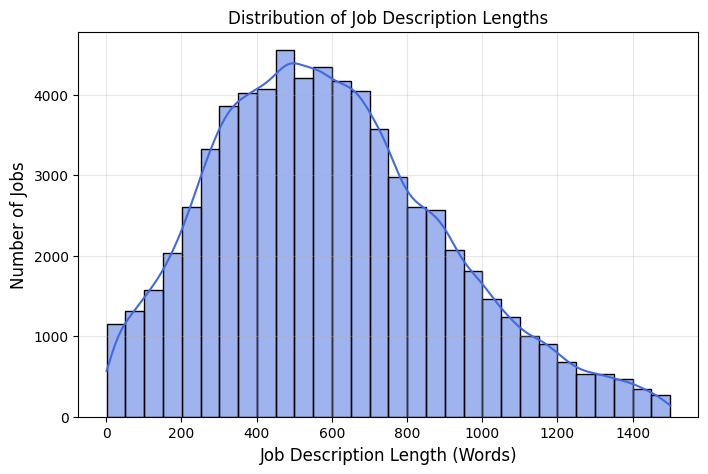

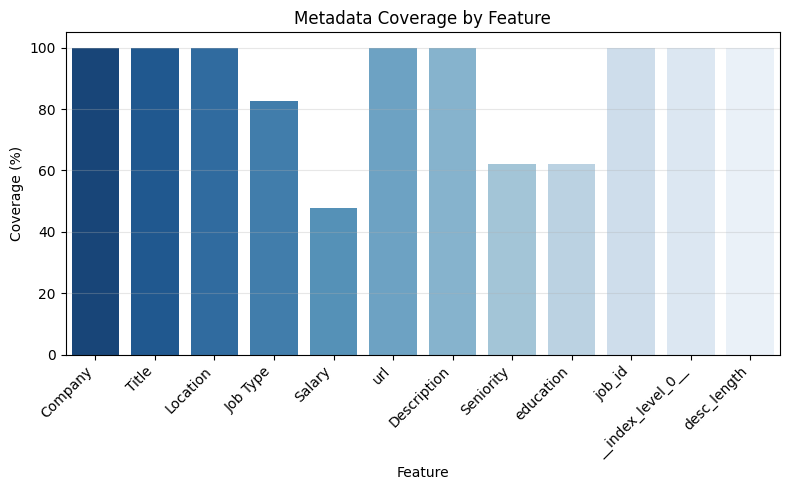

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, size, split, count, when
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Initialize Spark session
spark = SparkSession.builder.appName("job_analysis").getOrCreate()

# Feature display names
feature_names = {
   "company": "Company", 
   "title": "Title",
   "location": "Location", 
   "job_type": "Job Type",
   "salary": "Salary",
   "seniority": "Seniority",
   "description": "Description"
}

def analyze_job_descriptions(df):
   # Add word count column
   df = df.withColumn("desc_length", 
                     size(split(col("description"), " ")))
   
   # Get description lengths
   desc_lengths = [float(x.desc_length) for x in 
                  df.select("desc_length").collect()]
   
   # Plot length distribution
   plt.figure(figsize=(8, 5))
   sns.histplot(desc_lengths, bins=30, kde=True, color="royalblue")
   plt.xlabel("Job Description Length (Words)", fontsize=12)
   plt.ylabel("Number of Jobs", fontsize=12)
   plt.title("Distribution of Job Description Lengths")
   plt.grid(True, alpha=0.3)
   plt.show()
   
   # Get metadata coverage
   total_rows = float(df.count())
   
   metadata = {}
   for col_name in df.columns:
       non_null = float(df.filter(col(col_name).isNotNull()).count())
       metadata[feature_names.get(col_name, col_name)] = (non_null/total_rows) * 100
       
   # Convert to pandas for plotting
   metadata_df = pd.DataFrame(list(metadata.items()), 
                            columns=['Feature', 'Coverage'])
   
   # Plot metadata coverage
   plt.figure(figsize=(8, 5))
   sns.barplot(data=metadata_df,
              x='Feature',
              y='Coverage',
              palette="Blues_r")
   
   plt.xticks(rotation=45, ha='right')
   plt.ylabel("Coverage (%)")
   plt.title("Metadata Coverage by Feature")
   plt.grid(axis='y', alpha=0.3)
   plt.tight_layout()
   plt.show()
   

analyze_job_descriptions(df)


In [0]:
# For simplicity, we will keep only jobs with max 1500 words in the description
df = df.filter(col("desc_length") <= 1500)

### Now we will extract features from the data
We will extract "job-type", "education", "seniority" and clean the location feature

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf, col, regexp_replace, lower, trim
from pyspark.sql.types import StringType
import re

### **1. Define a Spark UDF for Cleaning Text**
def clean_text(text: str) -> str:
    """Clean text while preserving essential patterns."""
    if text is None:
        return None  # Handle null values gracefully
    text = text.lower().strip()
    # Replace special characters with space, except hyphens between words
    text = re.sub(r'[^\w\s-]|(?<!\w)-|-(?!\w)', ' ', text)
    # Normalize whitespace
    text = re.sub(r'\s+', ' ', text)
    return text

# Register the UDF in Spark
clean_text_udf = udf(clean_text, StringType())


### 1. First we will clean the 'location' feature and normalize it to look like this: 'city, COUNTRY'. For example - 'Houston, TX'

In [0]:
df = df.withColumn("clean_location", clean_text_udf(col("location")))

#Remove Digits from Location (Equivalent to `re.sub(r'\d+', '', x)`)
df = df.withColumn("clean_location", regexp_replace(col("clean_location"), r"\d+", ""))

# Count Unique Locations
unique_locations = df.select("clean_location").distinct().count()

# Show results
df.display()
print(f'Number of different locations: {unique_locations}')

company title location job_type salary url description seniority education job_id __index_level_0__ desc_length clean_location Occidental Petroleum Corporation Scientist Houston, TX null null https://indeed.com/viewjob?jk=97cba0ef68c6facb&bb=A7MPJFp0rpFNZYzr8AE7QYuI6rW0kVt2FBxzrBQDEixhyoBHA5W-3mKwpPdtawWvhZe6KhQKDkBZwgPneuTxf4h2bSWEIC-dAvnaVyKQ50SZAJbIg5PA4jMCppBCJgfu&xkcb=SoAj67M3350T_VyRJ50IbzkdCdPP&fccid=1df86a463f86c9a6&vjs=3 Oxy is an international energy company with assets primarily in the United States, the Middle East and North Africa. We are one of the largest oil and gas producers in the U.S., including a leading producer in the Permian and DJ basins, and offshore Gulf of Mexico. Our midstream and marketing segment provides flow assurance and maximizes the value of our oil and gas. Our chemical subsidiary OxyChem manufactures the building blocks for life-enhancing products. Our Oxy Low Carbon Ventures subsidiary is advancing leading-edge technologies and business solutions that economically grow our business while reducing emissions. We are committed to using our global leadership in carbon management to advance a lower-carbon world. Visit oxy.com for more information. Occidental strives to attract and retain talented employees by investing in their professional development and providing rewarding opportunities for personal growth. Our goal is to meet the highest employer standards by ensuring the health and safety of our employees, protecting the environment and positively impacting our communities where we do business. We are looking for an experienced and motivated individual to fill the position of Scientist within our Oxy Low Carbon Ventures Technology Organization based in Houston, TX . The Scientist will be accountable for developing and improving chemical processes to support OLCV activities under the direction of the Technology Development Manager. Roles and Responsibilities: Utilize high-performance computing to simulate physicochemical processes. Utilize cheminformatics tools like RDKit for preprocessing molecular data and develop custom models for physio-chemical property predictions. Leverage state of the art ML architectures (GNN, Diffusion Models, Flow Matching, LLM) for generative tasks in molecular design. Develop functional workflows to integrate multiple open/closed source tools into comprehensive computational frameworks. Provide data reduction, multivariate data analysis, and statistical analysis. Process and analyze experimental data using appropriate statistical methods to refine simulations. Develop and apply specialized software tools for data collection, analysis, and visualization. Collaborate with computer scientists to enhance software capabilities. Collaborate with experimentalists to validate and guide computational simulations Interpret statistical results to draw meaningful conclusions. Communicate findings to colleagues and stakeholders. Modeling and visualizing reaction pathways and exploring fundamental processes. Create computer models of chemical reactions to understand kinetics and thermodynamics. Qualifications Education: B.Sc. (minimum) or M.Sc./PhD (preferred) in Chemical Engineering (preferred), Chemistry, or related disciplines. Ability to work in the US is preferred. Experience: Minimum of 2 years of experience in an academic or industrial laboratory environment with a focus on molecular dynamics, cheminformatics, Density Functional Theory, chemical data science, design of experiments, ab initio methods, and data analysis. Experience in industrial process chemistry is a plus. Experience with developing, deploying, and implementing computational chemistry and ML workflows is a plus. Experience with de novo molecular design and optimization is a plus. Experience developing and leveraging foundational models is a plus. Experience in reaction kinetics experimentation and modeling is a plus. Research and development experience in computational chemistry. Skills and Competencie

Number of different locations: 6117


### 2. Extract and normalize the 'job_type' feature

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, udf, array, lit, when
from pyspark.sql.types import ArrayType, StringType
import re

def create_job_type_udf():
   def normalize_job_types(text):
       if not text or not isinstance(text, str) or text.strip() in ['-', 'Other', 'OTHER']:
           return None
           
       valid_types = {
           'full time': ['fulltime', 'full-time', 'full_time'],
           'part time': ['parttime', 'part-time', 'part_time'],
           'internship': ['intern','internship'], 
           'contract': ['contractor', 'freelance','contract', 'freelancer'],
           'temporary': ['temp', 'seasonal','temporary']
       }
       
       text = text.lower()
       text = text.replace('-', '')
       text = re.sub(r'[^a-z\s,]', '', text)
       text = text.strip()
       
       parts = [part.strip() for part in text.split(',') if part.strip()]
       job_types = set()
       
       for part in parts:
           clean_part = ''.join(part.split())
           for standard_type, variations in valid_types.items():
               if clean_part in [standard_type.replace(' ', '')] + variations:
                   job_types.add(standard_type)
                   
       return list(job_types) if job_types else None
       
   return udf(normalize_job_types, ArrayType(StringType()))

def create_extract_types_udf():
   def extract_job_types(text):
       if not text or not isinstance(text, str):
           return None
           
       patterns = {
           'full time': r'\b(full[-\s]?time|ft)\b',
           'part time': r'\b(part[-\s]?time|pt)\b', 
           'contract': r'\b(contract(?:or)?|freelancer|freelance)\b',
           'temporary': r'\b(temporary|temp)\b',
           'internship': r'\b(intern(?:ship)?)\b'
       }
       
       job_types = []
       text = text.lower()
       for job_type, pattern in patterns.items():
           if re.search(pattern, text, re.IGNORECASE):
               job_types.append(job_type)
               
       return job_types if job_types else None
       
   return udf(extract_job_types, ArrayType(StringType()))

def process_job_types(df):
   normalize_udf = create_job_type_udf()
   extract_udf = create_extract_types_udf()
   
   # Step 1: Normalize existing job types
   df = df.withColumn('job_type', normalize_udf(col('job_type')))
   
   # Step 2: Extract from title where missing
   df = df.withColumn(
       'job_type',
       when(col('job_type').isNull(), 
            extract_udf(col('title')))
       .otherwise(col('job_type'))
   )
   
   # Step 3: Extract from description where still missing 
   df = df.withColumn(
       'job_type',
       when(col('job_type').isNull(),
            extract_udf(col('description')))
       .otherwise(col('job_type'))
   )
   
   return df

def analyze_job_types(df):
   null_count = df.filter(col('job_type').isNull()).count()
   print(f"\nRows with no job type: {null_count}")
   
   print("\nTop job type combinations:")
   df.filter(col('job_type').isNotNull()) \
     .groupBy('job_type') \
     .count() \
     .orderBy('count', ascending=False) \
     .show(10, truncate=False)

df = process_job_types(df)
analyze_job_types(df)


Rows with no job type: 35138

Top job type combinations:
+---------------------------------+-----+
|job_type                         |count|
+---------------------------------+-----+
|[full time]                      |14352|
|[contract]                       |5416 |
|[part time]                      |3956 |
|[full time, part time]           |3259 |
|[full time, contract]            |1840 |
|[temporary]                      |758  |
|[full time, temporary]           |582  |
|[internship]                     |489  |
|[full time, part time, contract] |426  |
|[full time, part time, temporary]|421  |
+---------------------------------+-----+
only showing top 10 rows



### 3. Now we will extract and normalize the 'seniority' feature

In [0]:
# Count None (Null) Values
num_none_values = df.filter(col("seniority").isNull()).count()
print(f"\nNumber of None values in the Seniority feature: {num_none_values}")

# Count Unique Values (Equivalent to `value_counts(dropna=False)`)
seniority_distribution = (
    df.groupBy("seniority")
    .agg(count("*").alias("count"))
    .orderBy(col("count").desc())
)

# Show our results
print("\nSeniority Distribution:")
seniority_distribution.show()


Number of None values in the Seniority feature: 25847

Seniority Distribution:
+----------------+-----+
|       seniority|count|
+----------------+-----+
|            NULL|25847|
|    Senior level|13100|
|     Entry level| 6940|
|       Associate| 6809|
|Mid-Senior level| 5692|
|        Director| 4508|
|       Executive| 2681|
|  Not Applicable| 2309|
|      Internship|  445|
+----------------+-----+



In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf, col, when, regexp_replace
from pyspark.sql.types import StringType

def create_seniority_udf():
   def extract_seniority(text):
       if not text or not isinstance(text, str):
           return None
           
       patterns = {
           'Executive': r'\b(?:c[efot]o|chief(?:\s+[a-z]+){1,3}\s+officer|vice[\s-]+president|vp|executive\s+director|president|managing[\s-]+director|svp|evp)\b',
           'Director': r'\b(?:senior\s+director|director(?:\s+of\s+|\s+)|head[\s-]+of)\b(?!.*(?:intern|trainee|junior|entry))',
           'Senior level': r'\b(?:(?:senior|sr\.?)(?:\s+[a-z]+){1,3}|principal(?:\s+[a-z]+){1,2}|lead(?:\s+[a-z]+){1,2})\b(?![\s-]*(?:director|vp|president|intern|trainee|junior|associate))',
           'Mid-Senior level': r'\b(?:mid[\s-]*senior|mid[\s-]*level|specialist|consultant)\b(?![\s-]*(?:senior|principal|director|vp|president|intern|trainee|junior))',
           'Associate': r'\b(?:junior(?:\s+[a-z]+){1,2}|jr\.?(?:\s+[a-z]+){1,2}|associate)\b(?![\s-]*(?:director|senior|principal|lead))',
           'Entry level': r'\b(?:entry[\s-]*level|graduate|trainee|coordinator)\b(?![\s-]*(?:senior|lead|principal|director|manager))',
           'Internship': r'\b(?:intern(?:ship)?|apprentice)\b(?![\s-]*(?:manager|director|supervisor|lead|senior|principal))'
       }

       # Check conflicts
       conflicts = [
           (r'\b(?:senior|lead|principal)\b', r'\b(?:junior|trainee|intern)\b'),
           (r'\b(?:director|executive)\b', r'\b(?:intern|trainee|junior|entry)\b'),
           (r'\b(?:manager)\b', r'\b(?:intern|trainee)\b'),
       ]
       
       text = text.lower()
       for pat1, pat2 in conflicts:
           if re.search(pat1, text, re.I) and re.search(pat2, text, re.I):
               return None
               
       for level, pattern in patterns.items():
           if re.search(pattern, text, re.I):
               return level
               
       return None
       
   return udf(extract_seniority, StringType())

def process_seniority(df):
   extract_udf = create_seniority_udf()
   
   return df.withColumn(
       'seniority',
       when(col('seniority').isNull() | (col('seniority') == ''),
            when(extract_udf(col('title')).isNull(),
                 extract_udf(col('description')))
            .otherwise(extract_udf(col('title'))))
       .otherwise(col('seniority'))
   )

df = process_seniority(df)
df.display()

company title location job_type salary url description seniority education job_id __index_level_0__ desc_length clean_location Occidental Petroleum Corporation Scientist Houston, TX null null https://indeed.com/viewjob?jk=97cba0ef68c6facb&bb=A7MPJFp0rpFNZYzr8AE7QYuI6rW0kVt2FBxzrBQDEixhyoBHA5W-3mKwpPdtawWvhZe6KhQKDkBZwgPneuTxf4h2bSWEIC-dAvnaVyKQ50SZAJbIg5PA4jMCppBCJgfu&xkcb=SoAj67M3350T_VyRJ50IbzkdCdPP&fccid=1df86a463f86c9a6&vjs=3 Oxy is an international energy company with assets primarily in the United States, the Middle East and North Africa. We are one of the largest oil and gas producers in the U.S., including a leading producer in the Permian and DJ basins, and offshore Gulf of Mexico. Our midstream and marketing segment provides flow assurance and maximizes the value of our oil and gas. Our chemical subsidiary OxyChem manufactures the building blocks for life-enhancing products. Our Oxy Low Carbon Ventures subsidiary is advancing leading-edge technologies and business solutions that economically grow our business while reducing emissions. We are committed to using our global leadership in carbon management to advance a lower-carbon world. Visit oxy.com for more information. Occidental strives to attract and retain talented employees by investing in their professional development and providing rewarding opportunities for personal growth. Our goal is to meet the highest employer standards by ensuring the health and safety of our employees, protecting the environment and positively impacting our communities where we do business. We are looking for an experienced and motivated individual to fill the position of Scientist within our Oxy Low Carbon Ventures Technology Organization based in Houston, TX . The Scientist will be accountable for developing and improving chemical processes to support OLCV activities under the direction of the Technology Development Manager. Roles and Responsibilities: Utilize high-performance computing to simulate physicochemical processes. Utilize cheminformatics tools like RDKit for preprocessing molecular data and develop custom models for physio-chemical property predictions. Leverage state of the art ML architectures (GNN, Diffusion Models, Flow Matching, LLM) for generative tasks in molecular design. Develop functional workflows to integrate multiple open/closed source tools into comprehensive computational frameworks. Provide data reduction, multivariate data analysis, and statistical analysis. Process and analyze experimental data using appropriate statistical methods to refine simulations. Develop and apply specialized software tools for data collection, analysis, and visualization. Collaborate with computer scientists to enhance software capabilities. Collaborate with experimentalists to validate and guide computational simulations Interpret statistical results to draw meaningful conclusions. Communicate findings to colleagues and stakeholders. Modeling and visualizing reaction pathways and exploring fundamental processes. Create computer models of chemical reactions to understand kinetics and thermodynamics. Qualifications Education: B.Sc. (minimum) or M.Sc./PhD (preferred) in Chemical Engineering (preferred), Chemistry, or related disciplines. Ability to work in the US is preferred. Experience: Minimum of 2 years of experience in an academic or industrial laboratory environment with a focus on molecular dynamics, cheminformatics, Density Functional Theory, chemical data science, design of experiments, ab initio methods, and data analysis. Experience in industrial process chemistry is a plus. Experience with developing, deploying, and implementing computational chemistry and ML workflows is a plus. Experience with de novo molecular design and optimization is a plus. Experience developing and leveraging foundational models is a plus. Experience in reaction kinetics experimentation and modeling is a plus. Research and development experience in computational chemistry. Skills and Competencie

### 4. Extract education feature from job description

In [0]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import udf, col
from pyspark.sql.types import StringType
import re

def create_education_udf():
   education_order = {
       'high_school': 0,
       'bachelor': 1, 
       'master': 2,
       'phd': 3
   }

   education_patterns = {
       'phd': r'\b(ph\.?d\.?|doctorate|doctoral)\b',
       'master': r"\b(master(?:'s|\s+degree)?|m\.?s\.?c?|m\.?eng\.?|m\.?a\.?|mba|m\.?tech|advanced\s+degree|graduate\s+degree)\b",
       'bachelor': r"\b(bachelor(?:'s|\s+degree)?|b\.?s\.?c?|b\.?eng\.?|b\.?a\.?|bsc|bs|ba|undergraduate)\b",
       'high_school': r'\b(high\s+school(?:\s+diploma)?|secondary\s+education|ged)\b'
   }

   def extract_education(text):
       if not isinstance(text, str):
           return None
           
       found_levels = {}
       for level, pattern in education_patterns.items():
           if re.search(pattern, text, re.IGNORECASE):
               found_levels[level] = education_order[level]
               
       if found_levels:
           return min(found_levels, key=lambda x: found_levels[x])
       return None
       
   return udf(extract_education, StringType())

def process_job_listings(df):
   extract_udf = create_education_udf()
   return df.withColumn('education', extract_udf(col('description')))

# Usage
spark = SparkSession.builder.appName("education_processing").getOrCreate()
df = process_job_listings(df)
df.display()

company title location job_type salary url description seniority education job_id __index_level_0__ desc_length clean_location Occidental Petroleum Corporation Scientist Houston, TX null null https://indeed.com/viewjob?jk=97cba0ef68c6facb&bb=A7MPJFp0rpFNZYzr8AE7QYuI6rW0kVt2FBxzrBQDEixhyoBHA5W-3mKwpPdtawWvhZe6KhQKDkBZwgPneuTxf4h2bSWEIC-dAvnaVyKQ50SZAJbIg5PA4jMCppBCJgfu&xkcb=SoAj67M3350T_VyRJ50IbzkdCdPP&fccid=1df86a463f86c9a6&vjs=3 Oxy is an international energy company with assets primarily in the United States, the Middle East and North Africa. We are one of the largest oil and gas producers in the U.S., including a leading producer in the Permian and DJ basins, and offshore Gulf of Mexico. Our midstream and marketing segment provides flow assurance and maximizes the value of our oil and gas. Our chemical subsidiary OxyChem manufactures the building blocks for life-enhancing products. Our Oxy Low Carbon Ventures subsidiary is advancing leading-edge technologies and business solutions that economically grow our business while reducing emissions. We are committed to using our global leadership in carbon management to advance a lower-carbon world. Visit oxy.com for more information. Occidental strives to attract and retain talented employees by investing in their professional development and providing rewarding opportunities for personal growth. Our goal is to meet the highest employer standards by ensuring the health and safety of our employees, protecting the environment and positively impacting our communities where we do business. We are looking for an experienced and motivated individual to fill the position of Scientist within our Oxy Low Carbon Ventures Technology Organization based in Houston, TX . The Scientist will be accountable for developing and improving chemical processes to support OLCV activities under the direction of the Technology Development Manager. Roles and Responsibilities: Utilize high-performance computing to simulate physicochemical processes. Utilize cheminformatics tools like RDKit for preprocessing molecular data and develop custom models for physio-chemical property predictions. Leverage state of the art ML architectures (GNN, Diffusion Models, Flow Matching, LLM) for generative tasks in molecular design. Develop functional workflows to integrate multiple open/closed source tools into comprehensive computational frameworks. Provide data reduction, multivariate data analysis, and statistical analysis. Process and analyze experimental data using appropriate statistical methods to refine simulations. Develop and apply specialized software tools for data collection, analysis, and visualization. Collaborate with computer scientists to enhance software capabilities. Collaborate with experimentalists to validate and guide computational simulations Interpret statistical results to draw meaningful conclusions. Communicate findings to colleagues and stakeholders. Modeling and visualizing reaction pathways and exploring fundamental processes. Create computer models of chemical reactions to understand kinetics and thermodynamics. Qualifications Education: B.Sc. (minimum) or M.Sc./PhD (preferred) in Chemical Engineering (preferred), Chemistry, or related disciplines. Ability to work in the US is preferred. Experience: Minimum of 2 years of experience in an academic or industrial laboratory environment with a focus on molecular dynamics, cheminformatics, Density Functional Theory, chemical data science, design of experiments, ab initio methods, and data analysis. Experience in industrial process chemistry is a plus. Experience with developing, deploying, and implementing computational chemistry and ML workflows is a plus. Experience with de novo molecular design and optimization is a plus. Experience developing and leveraging foundational models is a plus. Experience in reaction kinetics experimentation and modeling is a plus. Research and development experience in computational chemistry. Skills and Competencie

### Lets visualize again the data after the changes

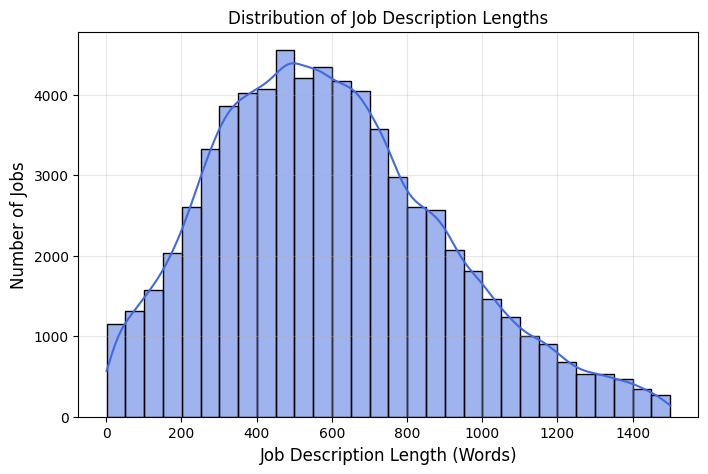

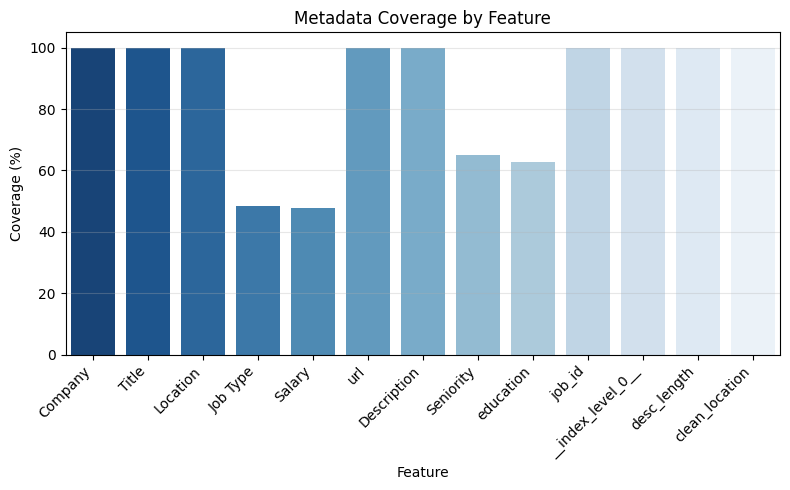

In [0]:
analyze_job_descriptions(df)


In [0]:
# Drop columns we dont need
df_spark = df.drop("desc_length").withColumnRenamed("seniority_normalized", "seniority")

# Part 2: Set up Pinecone vectorstore, and insert the data

In [0]:
# If we run on databricks, first we need to install some libraries
!pip install python-louvain spacy pinecone sentence-transformers
!python -m spacy download en_core_web_sm

### This is the code of the Semantic Graph Chuncker. If running on local IDE, can simply inport the file

In [0]:
### This is the semantic graph chunker code. 

import math
import numpy as np
import networkx as nx
from sentence_transformers import SentenceTransformer
from networkx.algorithms import community as nx_community
import community as community_louvain  # pip install python-louvain
import spacy


class SemanticGraphChunker:
    def __init__(
        self,
        model_name="all-MiniLM-L6-v2",
        window_size=5,         # Increased window size helps connect more sentences.
        penalty_alpha=0.5,     # Lower decay so distant sentences still contribute.
        sim_threshold=0.5,     # Threshold for edges creation
        min_chunk_sentences=10  # Minimum number of sentences per chunk.
    ):
        """
        Initialize the chunker.

        Args:
            model_name (str): The SentenceTransformer model name.
            window_size (int): Number of sentences before and after to consider for graph edges.
            penalty_a (float): Decay factor in the penalty exp(-a * |i-j|) for sentence distance.
            sim_threshold (float): Minimum weighted similarity to add an edge.
            min_chunk_sentences (int): Minimum sentences desired in each final chunk. Adjacent communities
                                       will be merged if needed.
        """
        self.model = SentenceTransformer(model_name)
        self.window_size = window_size
        self.penalty_a = penalty_alpha
        self.sim_threshold = sim_threshold
        self.min_chunk_sentences = min_chunk_sentences
        # Load spaCy's English model with unnecessary components disabled for speed.
        self.nlp = spacy.load("en_core_web_sm", disable=["ner", "tagger"])

        # Pre-compute penalty factors for distances 1 through window_size.
        self.penalty = {d: math.exp(-self.penalty_a * d) for d in range(1, self.window_size + 1)}

    def chunk_text(self, text):
        """
        Chunk the input text into larger semantically coherent chunks.
        Each chunk is returned as a single string (its sentences joined together).

        Args:
            text (str): The input text to be chunked.

        Returns:
            List[str]: A list of chunk strings.
        """
        # 1. Split text into sentences.
        sentences = self._split_sentences(text)
        if not sentences:
            return []

        # 2. Compute normalized embeddings.
        embeddings = self._embed_sentences(sentences)

        # 3. Build the graph over sentences.
        graph = self._build_graph(sentences, embeddings)

        # 4. Detect communities (preliminary chunks) in the graph.
        communities = self._detect_communities(graph)

        # 5. Process and merge communities: sort by original order, then merge small adjacent chunks.
        chunks = self._process_communities(communities, sentences)

        return chunks

    def _split_sentences(self, text):
        """
        Use spaCy to segment text into sentences.

        Args:
            text (str): The input text.

        Returns:
            List[str]: List of sentences.
        """
        doc = self.nlp(text)
        return [sent.text.strip() for sent in doc.sents if sent.text.strip()]

    def _embed_sentences(self, sentences):
        """
        Compute normalized sentence embeddings.

        Args:
            sentences (List[str]): List of sentences.

        Returns:
            np.ndarray: Array of normalized embeddings.
        """
        embeddings = self.model.encode(sentences, convert_to_numpy=True)
        # Normalize each embedding so cosine similarity is just the dot product.
        norms = np.linalg.norm(embeddings, axis=1, keepdims=True)
        norms[norms == 0] = 1
        return embeddings / norms


    def _build_graph(self, sentences, embeddings):
        """
        Build a graph where nodes are sentences and edges connect sentences within a window.
        Edge weights are the cosine similarity multiplied by a distance penalty.
        Only edges above a similarity threshold are kept.
        This version uses vectorized operations to compute similarities for each allowed offset.

        Args:
            sentences (List[str]): List of sentences.
            embeddings (np.ndarray): Normalized embeddings.

        Returns:
            networkx.Graph: The constructed graph.
        """
        G = nx.Graph()
        n = len(sentences)

        # Add nodes.
        for i, sentence in enumerate(sentences):
            G.add_node(i, sentence=sentence)

        # Use vectorized computations over offsets.
        edge_list = []
        for d in range(1, self.window_size + 1):
            if n - d <= 0:
                break

            # Compute cosine similarities for all pairs separated by offset d.
            # embeddings[:-d] and embeddings[d:] both have shape (n-d, embedding_dim).
            sims = np.sum(embeddings[:-d] * embeddings[d:], axis=1)  # vectorized dot product
            # Apply distance penalty.
            weighted_sims = sims * self.penalty[d]

            # Get indices where the weighted similarity exceeds the threshold.
            valid_idx = np.where(weighted_sims >= self.sim_threshold)[0]
            if valid_idx.size > 0:
                i_indices = valid_idx
                j_indices = valid_idx + d
                weights = weighted_sims[valid_idx]
                # Convert the arrays to a list of edge tuples.
                edges = list(zip(i_indices.tolist(), j_indices.tolist(), weights.tolist()))
                edge_list.extend(edges)

        G.add_weighted_edges_from(edge_list)
        return G

    def _detect_communities(self, graph):
        """
        Use the Louvain algorithm to detect communities in the graph.

        Args:
            graph (networkx.Graph): The sentence graph.

        Returns:
            List[set]: A list of sets where each set contains node indices belonging to a community.
        """
        # Compute partition using Louvain.
        partition = community_louvain.best_partition(graph, weight="weight")
        # Aggregate nodes by community id.
        communities = {}
        for node, comm in partition.items():
            communities.setdefault(comm, set()).add(node)
        return list(communities.values())


    def _process_communities(self, communities, sentences):
        """
        Process communities by sorting sentence indices, merging adjacent communities if they are too small,
        and then joining the sentences into a coherent string for each chunk.

        Args:
            communities (List[set]): Communities from the graph.
            sentences (List[str]): Original sentences.

        Returns:
            List[str]: Final chunk strings.
        """
        # Convert each community to a sorted list.
        sorted_chunks = [sorted(list(comm)) for comm in communities]
        sorted_chunks.sort(key=lambda chunk: chunk[0])

        # Merge adjacent chunks if they are contiguous and too small.
        merged_chunks = self._merge_small_chunks(sorted_chunks, self.min_chunk_sentences)

        # Join sentences in each chunk.
        chunks = [" ".join(sentences[i] for i in chunk) for chunk in merged_chunks]
        return chunks

    def _merge_small_chunks(self, sorted_chunks, min_size):
        """
        Merge adjacent (contiguous) communities if one of them is smaller than the minimum size.
        This procedure runs iteratively until no further merges occur.

        Args:
            sorted_chunks (List[List[int]]): List of communities as sorted lists of indices.
            min_size (int): Minimum number of sentences per chunk.

        Returns:
            List[List[int]]: Merged communities.
        """
        merged = sorted_chunks[:]  # Make a copy.
        changed = True
        while changed:
            changed = False
            new_merged = []
            i = 0
            while i < len(merged):
                # If there is a next chunk and the two are contiguous,
                # and if the current chunk is smaller than the minimum size,
                # then merge them.
                if (i < len(merged) - 1 and merged[i][-1] + 1 == merged[i + 1][0] and len(merged[i]) < min_size):
                    new_merged.append(merged[i] + merged[i + 1])
                    i += 2
                    changed = True
                else:
                    new_merged.append(merged[i])
                    i += 1
            merged = new_merged
        return merged

### Now we chuck the job descriptions

In [0]:
from pyspark.sql.functions import pandas_udf, col, explode, posexplode, row_number
from pyspark.sql.types import ArrayType, StringType
from pyspark.sql.window import Window

# Define pandas UDF for chunking
_chunker = None

@pandas_udf(ArrayType(StringType()))
def chunk_texts(series):
    # Initialize chunker lazily (once per worker)
    global _chunker
    if _chunker is None:
        _chunker = SemanticGraphChunker()
    
    return series.apply(lambda x: _chunker.chunk_text(x))

# Calculate optimal partitions
num_partitions = max(1, df_spark.count() // 100)

# Apply chunking and cache the result
result_df = (df_spark
    .repartition(num_partitions)
    .withColumn("chunks", chunk_texts(col("description")))
    .cache()  # Cache the result in memory
)

# Force computation and cache population
print(f"Processing {result_df.count()} rows...")

# Display cached results
print("Displaying initial results with chunks array...")
result_df.display()

# Now explode the chunks with index
window_spec = Window.partitionBy("job_id").orderBy("chunk")

df_spark = (result_df
    .drop("description")  # Drop original description
    .select("*", explode("chunks").alias("chunk"))  # First explode to get chunks
    .withColumn("chunk_index", row_number().over(window_spec) - 1)  # Add index using window
    .drop("chunks")  # Drop the original chunks array
    .cache()  # Cache the exploded results
)

# Force computation of exploded data
print(f"Creating {df_spark.count()} exploded rows...")

# Display exploded results
print("Displaying exploded results...")
df_spark.display()



### Now, for each chunk, we will add information to enhance the embeddings

In [0]:
from pyspark.sql.functions import col, concat, lit, coalesce

df_spark = df_spark.withColumn(
    "chunk",
    concat(
        lit("Company: "), coalesce(col("company"), lit("")), lit(" | "),
        lit("Title: "), coalesce(col("title"), lit("")), lit(" | "),
        lit("Location: "), coalesce(col("location"), lit("")), lit(".\n"),
        col("chunk")
    )
)


### We create embeddings for all chunks

In [0]:
from pyspark.sql.functions import pandas_udf, col
from pyspark.sql.types import ArrayType, FloatType
from sentence_transformers import SentenceTransformer
import pinecone
import pandas as pd

# Define pandas UDF for embeddings
_model = None

@pandas_udf(ArrayType(FloatType()))
def get_embeddings(series):
    # Initialize model lazily (once per worker)
    global _model
    if _model is None:
        _model = SentenceTransformer('intfloat/e5-base-v2')
    
    # Create embeddings for the batch
    embeddings = _model.encode(series.tolist(), normalize_embeddings=True)
    return pd.Series(list(embeddings))

# Calculate optimal partitions
num_partitions = max(1, df_spark.count() // 100)

# Add embeddings to the dataframe
df_spark = (df_spark
    .repartition(num_partitions)
    .withColumn('embedding', get_embeddings(col('chunk')))
    .cache()
)

# Force computation and show progress
print(f"Creating embeddings for {df_spark.count()} chunks...")
df_spark.display()



### Now we concert the 'education' and 'seniority from str values to numerical values

In [0]:
from pyspark.sql.functions import when, col, lower
# Make sure remote values
df_spark = df_spark.withColumn(
    "location",
    when(lower(col("location")).contains("remote"), "Remote").otherwise(col("location"))
)


df_spark = df_spark.withColumn(
    "education_value",
    when(col("education") == "high_school", 0)
    .when(col("education") == "bachelor", 1)
    .when(col("education") == "master", 2)
    .when(col("education") == "phd", 3)
    .otherwise(-1)  # Default case for missing or unknown values
)

df_spark = df_spark.withColumn(
    "seniority_value",
    when(col("seniority") == "Internship", 0)
    .when(col("seniority") == "Entry level", 1)
    .when(col("seniority") == "Associate", 2)
    .when(col("seniority") == "Mid-Senior level", 3)
    .when(col("seniority") == "Associate", 4)
    .when(col("seniority") == "Senior level", 5)
    .when(col("seniority") == "Director", 6)
    .when(col("seniority") == "Executive", 7)
    .otherwise(-1)  # Default case for missing or unknown values
)


### Set Pinecone vector DB and upload data to it

In [0]:
from pinecone import Pinecone as PineconeClient, ServerlessSpec
from sentence_transformers import SentenceTransformer
import time

# Pinecone setup
PINECONE_REGION = 'us-east-1'
pinecone = PineconeClient(api_key=PINECONE_API_KEY)

# Embeddings model
embeddings_model = SentenceTransformer('intfloat/e5-base-v2')

def create_pinecone_index_if_not_exists(index_name: str, metric: str = "cosine"):
    # List existing indexes
    existing_indexes = pinecone.list_indexes().names()

    if index_name not in existing_indexes:
        # Get embedding dimension
        dimension = embeddings_model.encode('hello').shape[0]

        # Create index
        pinecone.create_index(
            name=index_name,
            dimension=dimension,
            metric=metric,
            spec=ServerlessSpec(cloud="aws", region=PINECONE_REGION)
        )

        # Wait for index to be ready
        while True:
            index_status = pinecone.describe_index(index_name).status
            if index_status["ready"]:
                break
            time.sleep(1)

    return pinecone.Index(index_name)

# Create or load index
index = create_pinecone_index_if_not_exists("data-lab-project")


### Insert the data to Pinecone vector DB

In [0]:
from tqdm import tqdm
import numpy as np

# Process in batches of 100
batch_size = 100
total_batches = (len(df_spark) + batch_size - 1) // batch_size

# Use tqdm for progress tracking
for batch_start in tqdm(range(0, len(df_spark), batch_size), total=total_batches, desc="Uploading to Pinecone"):
    # Get the current batch
    batch_df = df_spark.iloc[batch_start:batch_start + batch_size]
    
    # Convert batch to vectors
    batch_vectors = []
    for _, row in batch_df.iterrows():
        vector_id = f"{row['job_id']}_{row['chunk_index']}"
        metadata = {
            'text': row['chunk'] if row['chunk'] is not None else "",
            'company': row['company'] if row['company'] is not None else "",
            'title': row['title'] if row['title'] is not None else "",
            'location': row['location'] if row['location'] is not None else "USA",
            'job_type': row['job_type'].tolist() if isinstance(row['job_type'], (list, np.ndarray)) else (row['job_type'] if isinstance(row['job_type'], list) else []),  # Convert NumPy array to list or ensure a list
            'job_id': row['job_id'] if row['job_id'] is not None else "",
            'chunk_index': int(row['chunk_index']) if row['chunk_index'] is not None else -1,
            'url': row['url'] if row['url'] is not None else "",
            'seniority': row['seniority'] if row['seniority'] is not None else "",
            'seniority_value': row['seniority_value'] if row['seniority_value'] is not None else -1,
            'education': row['education'] if row['education'] is not None else "",
            'education_value': row['education_value'] if row['education_value'] is not None else -1,
        }
        # Convert numpy array to list for the embedding
        vector = row['embedding'].tolist() if hasattr(row['embedding'], 'tolist') else row['embedding']
        batch_vectors.append((vector_id, vector, metadata))
    
    # Upload batch
    index.upsert(vectors=batch_vectors)

# Verify upload
stats = index.describe_index_stats()
print(f"\nTotal vectors in index: {stats['total_vector_count']}")